In [1]:
# 1. System and OS-level utilities
import os
import random
import warnings

# 2. Data handling and machine learning
import pandas as pd
from sklearn.model_selection import train_test_split

# 3. Image processing
from PIL import Image
import cv2

# 4. Visualization and plotting
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

# 5. Suppress warnings
warnings.filterwarnings('ignore')

In [2]:
# get img_id & img_path & category name and id

# Define the root path of the UECFOOD100 dataset
data_path = "/kaggle/input/uecfood256/UECFOOD256"
data_list = []

# Load category names (id \t name)
category_file_path = os.path.join(data_path, "category.txt")
category_df = pd.read_csv(category_file_path, sep='\t', index_col='id')

if not category_df.empty:
    # loop through each folder
    for folder_id_str in os.listdir(data_path):
        try:
            folder_id = int(folder_id_str)
            folder_path = os.path.join(data_path, folder_id_str)
            if os.path.isdir(folder_path):
                # loop through imgs in each folder
                img_folder_path = folder_path
                for img_filename in os.listdir(img_folder_path):
                    if img_filename.endswith(".jpg"):

                        img_id = int(os.path.splitext(img_filename)[0])

                        img_path = os.path.join(img_folder_path, img_filename)#get img path

                        if folder_id in category_df.index:
                            category = category_df.loc[folder_id, 'name']
                            category_id = folder_id

                            data_list.append({
                                "img_id": img_id,
                                "img_path": img_path,
                                "category": category,
                                "category_id": category_id
                            })
        except ValueError:
            print(f"skip other folders: {folder_id_str}")

    data_df = pd.DataFrame(data_list)
    csv_output_path = "/kaggle/working/data_info.csv"
    data_df.to_csv(csv_output_path, index=False)

skip other folders: category.txt
skip other folders: README.txt


In [3]:
#get bounding box

# Load image info

csv_path = "/kaggle/working/data_info.csv"

data_df = pd.read_csv(csv_path)

# loop through each folder
for folder_id_str in os.listdir(data_path):
    try:
        folder_id = int(folder_id_str)
        folder_path = os.path.join(data_path, folder_id_str)
        if os.path.isdir(folder_path):
             # Read bounding box file into DataFrame
            bb_info_file_path = os.path.join(folder_path, "bb_info.txt")

            if os.path.exists(bb_info_file_path):
                try:
                          #create bb col
                          bb_info_df = pd.read_csv(bb_info_file_path, sep=' ', index_col=0, header=0, names=["x1", "y1", "x2", "y2"])

                          # loop through rows in bb_info_df
                          for img_id, bbox_info in bb_info_df.iterrows():
                            img_id = int(img_id)

                            pattern = f'/kaggle/input/uecfood256/UECFOOD256/{folder_id}/{img_id}.jpg'

                            matching_rows = data_df[data_df['img_path'] == pattern]

                            data_df.loc[matching_rows.index, ["x1", "y1", "x2", "y2"]] = [bbox_info["x1"], bbox_info["y1"], bbox_info["x2"], bbox_info["y2"]]

                except pd.errors.EmptyDataError:
                    print(f"No data found in {bb_info_file_path}")
    except ValueError:
        print(f"skip other folders: {folder_id_str}")

data_df.to_csv(csv_path, index=False)

skip other folders: category.txt
skip other folders: README.txt


In [4]:
data=pd.read_csv("/kaggle/working/data_info.csv")
data['category_id']=data['category_id']-1
data.to_csv('/kaggle/working/data_info.csv', index=False)
data.head()

,img_id,img_path,category,category_id,x1,y1,x2,y2
0,335042,/kaggle/input/uecfood256/UECFOOD256/248/335042...,bean curd family style,247,70.0,4.0,624.0,349.0
1,331307,/kaggle/input/uecfood256/UECFOOD256/248/331307...,bean curd family style,247,84.0,54.0,516.0,329.0
2,334649,/kaggle/input/uecfood256/UECFOOD256/248/334649...,bean curd family style,247,15.0,25.0,597.0,395.0
3,331256,/kaggle/input/uecfood256/UECFOOD256/248/331256...,bean curd family style,247,22.0,25.0,562.0,402.0
4,331747,/kaggle/input/uecfood256/UECFOOD256/248/331747...,bean curd family style,247,16.0,86.0,511.0,349.0


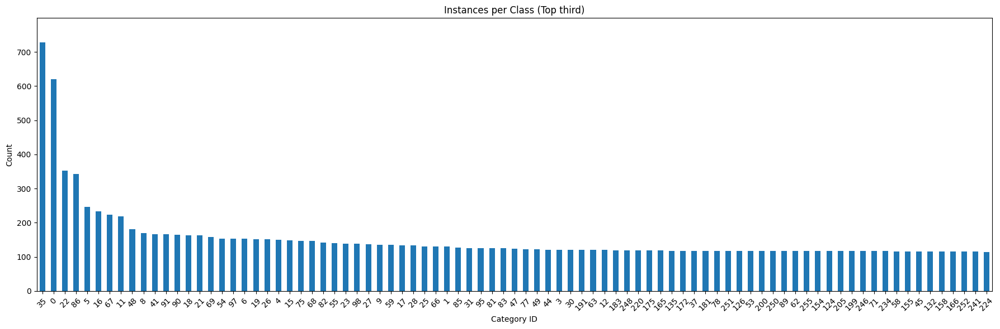

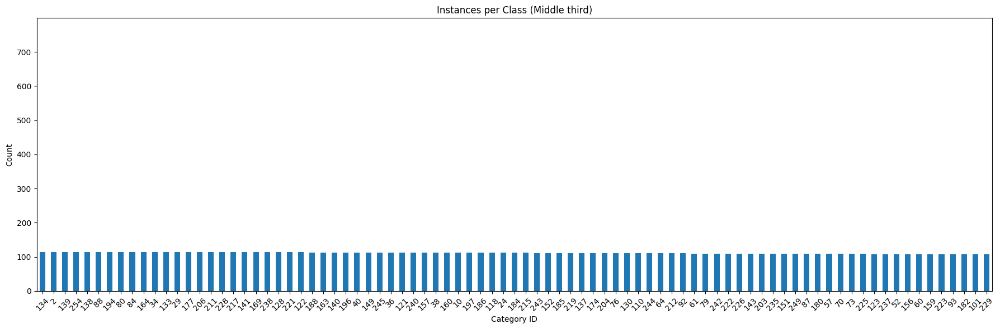

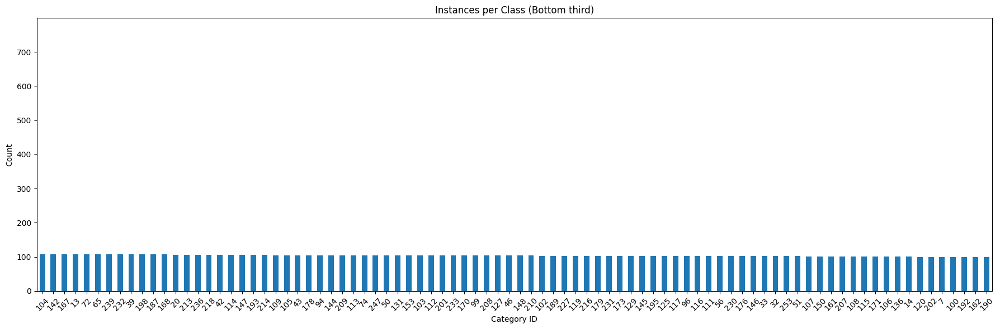

In [5]:
data = pd.read_csv('/kaggle/working/data_info.csv')

# Sort by frequency (descending), not by category id
category_counts = data['category_id'].value_counts().sort_values(ascending=False)

# Split into three roughly-equal chunks
n = len(category_counts)
k1 = n // 3
k2 = (2 * n) // 3

part1 = category_counts.iloc[:k1]      # top third (largest)
part2 = category_counts.iloc[k1:k2]    # middle third
part3 = category_counts.iloc[k2:]      # tail third

# Plot 1
plt.figure(figsize=(18, 6))
part1.plot(kind='bar')
plt.title('Instances per Class (Top third)')
plt.xlabel('Category ID')
plt.ylabel('Count')
plt.ylim(0, 799)         # <--- y-axis limit
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot 2
plt.figure(figsize=(18, 6))
part2.plot(kind='bar')
plt.title('Instances per Class (Middle third)')
plt.xlabel('Category ID')
plt.ylabel('Count')
plt.ylim(0, 799)         # <--- y-axis limit
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot 3
plt.figure(figsize=(18, 6))
part3.plot(kind='bar')
plt.title('Instances per Class (Bottom third)')
plt.xlabel('Category ID')
plt.ylabel('Count')
plt.ylim(0, 799)         # <--- y-axis limit
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [6]:
data = pd.read_csv('/kaggle/working/data_info.csv')

categories_and_samples = {
    0 : 450,
    35: 580,
    22: 190,
    86: 150,
    5 : 80,
    16: 50,
    67: 50,
    11: 50
}

for category_id, sample_size in categories_and_samples.items():
    zero_category_rows = data[data['category_id'] == category_id]
    rows_to_delete = random.sample(list(zero_category_rows.index), sample_size)
    data = data.drop(rows_to_delete)

data.to_csv('/kaggle/working/balanced.csv', index=False)

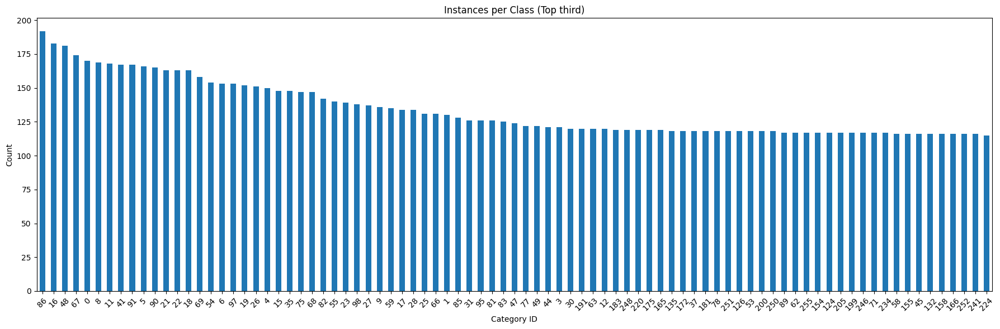

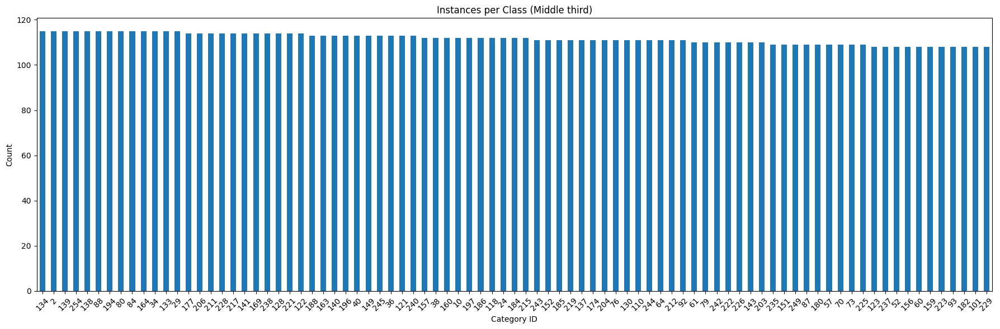

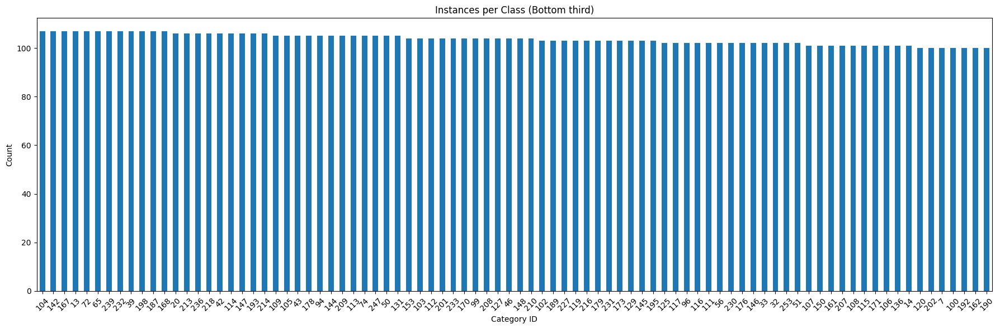

In [7]:
data = pd.read_csv('/kaggle/working/balanced.csv')

# Sort by frequency (descending), not by category id
category_counts = data['category_id'].value_counts().sort_values(ascending=False)

# Split into three roughly-equal chunks
n = len(category_counts)
k1 = n // 3
k2 = (2 * n) // 3

part1 = category_counts.iloc[:k1]      # top third (largest)
part2 = category_counts.iloc[k1:k2]    # middle third
part3 = category_counts.iloc[k2:]      # tail third

# Plot 1
plt.figure(figsize=(18, 6))
part1.plot(kind='bar')
plt.title('Instances per Class (Top third)')
plt.xlabel('Category ID')
plt.ylabel('Count')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot 2
plt.figure(figsize=(18, 6))
part2.plot(kind='bar')
plt.title('Instances per Class (Middle third)')
plt.xlabel('Category ID')
plt.ylabel('Count')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot 3
plt.figure(figsize=(18, 6))
part3.plot(kind='bar')
plt.title('Instances per Class (Bottom third)')
plt.xlabel('Category ID')
plt.ylabel('Count')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [8]:
n=pd.read_csv('/kaggle/working/balanced.csv')

len(n)

29795

In [9]:
df = pd.read_csv('/kaggle/working/balanced.csv')

merged_df = df.groupby('img_id', as_index=False).agg({
    'img_path': 'first',
    'category': lambda x: ','.join(x),
    'category_id': lambda x: ','.join(map(str, x)),
    'x1': lambda x: ','.join(map(str, x)),
    'y1': lambda x: ','.join(map(str, x)),
    'x2': lambda x: ','.join(map(str, x)),
    'y2': lambda x: ','.join(map(str, x))
})

merged_df.to_csv('/kaggle/working/multiple_data.csv', index=False)

In [10]:
df = pd.read_csv("/kaggle/working/multiple_data.csv")
df.head(10)

,img_id,img_path,category,category_id,x1,y1,x2,y2
0,1,/kaggle/input/uecfood256/UECFOOD256/42/1.jpg,jiaozi,41,363.0,91.0,800.0,560.0
1,2,/kaggle/input/uecfood256/UECFOOD256/1/2.jpg,rice,0,20.0,208.0,582.0,559.0
2,3,/kaggle/input/uecfood256/UECFOOD256/1/3.jpg,rice,0,2.0,110.0,243.0,410.0
3,4,/kaggle/input/uecfood256/UECFOOD256/1/4.jpg,rice,0,0.0,237.0,286.0,536.0
4,6,/kaggle/input/uecfood256/UECFOOD256/1/6.jpg,rice,0,0.0,38.0,369.0,310.0
5,8,/kaggle/input/uecfood256/UECFOOD256/1/8.jpg,rice,0,80.0,31.0,776.0,454.0
6,9,/kaggle/input/uecfood256/UECFOOD256/1/9.jpg,"rice,beef noodle","0,23","2.0,278.0","226.0,76.0","270.0,798.0","470.0,509.0"
7,15,/kaggle/input/uecfood256/UECFOOD256/84/15.jpg,spaghetti meat sauce,83,578.0,221.0,798.0,370.0
8,16,/kaggle/input/uecfood256/UECFOOD256/99/16.jpg,mixed rice,98,0.0,4.0,436.0,354.0
9,17,/kaggle/input/uecfood256/UECFOOD256/1/17.jpg,rice,0,0.0,33.0,414.0,486.0


In [11]:
data_df = pd.read_csv("/kaggle/working/multiple_data.csv")

train_df, test_df = train_test_split(data_df, test_size=0.1, random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.2, random_state=42)

train_csv_path = "/kaggle/working/train_data.csv"
val_csv_path = "/kaggle/working/val_data.csv"
test_csv_path = "/kaggle/working/test_data.csv"

train_df.to_csv(train_csv_path, index=False)
val_df.to_csv(val_csv_path, index=False)
test_df.to_csv(test_csv_path, index=False)

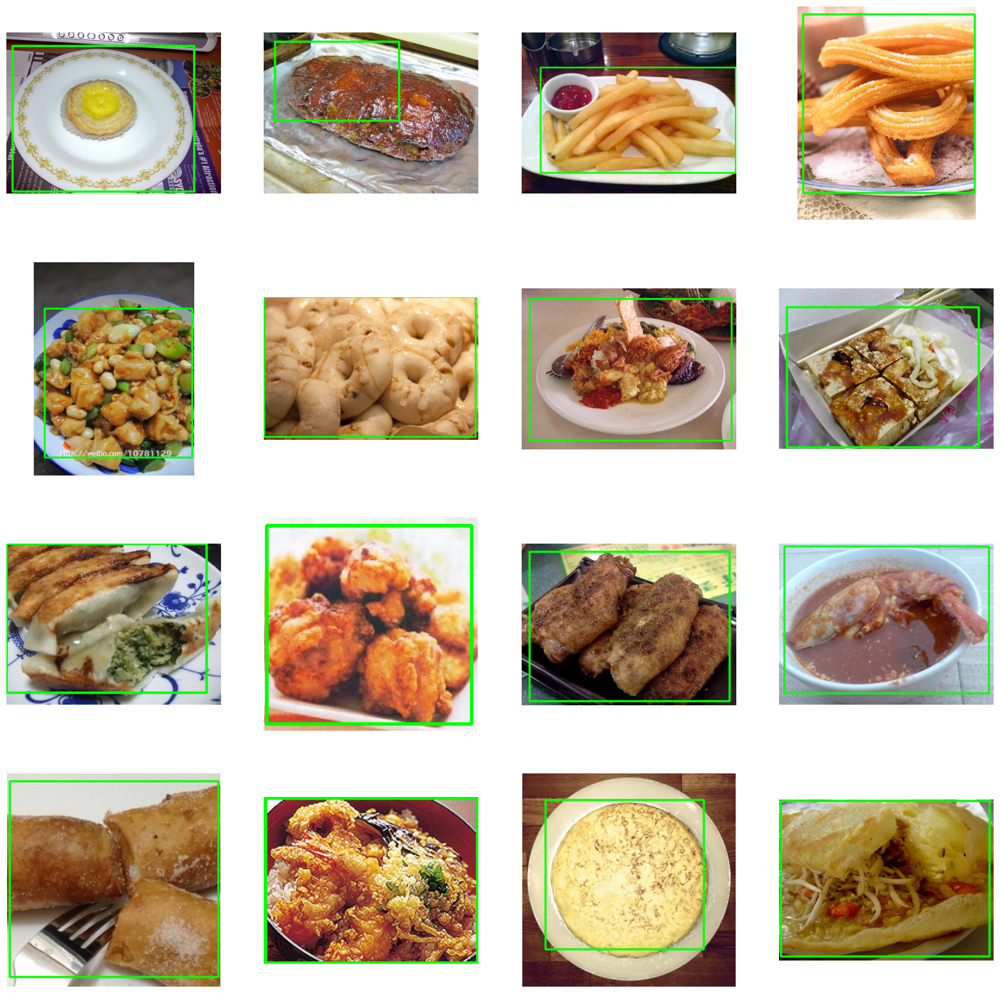

In [12]:
data_df = pd.read_csv("/kaggle/working/balanced.csv")


# Choose 16 random images from the dataframe
random_images = random.sample(range(len(data_df)), 16)

# Set up the plot with 4x4 grid
fig, axs = plt.subplots(4, 4, figsize=(20, 20))

for i, idx in enumerate(random_images):
    row = i // 4
    col = i % 4

    img_id = data_df.loc[idx, "img_id"]
    img_path = data_df.loc[idx, "img_path"]
    category_id = int(data_df.loc[idx, "category_id"])
    x1, y1, x2, y2 = int(data_df.loc[idx, "x1"]), int(data_df.loc[idx, "y1"]), int(data_df.loc[idx, "x2"]), int(data_df.loc[idx, "y2"])

    # Load the image
    img = cv2.imread(img_path)

    # Draw bounding box on the image
    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 3)

    # Display the image with bounding box
    axs[row, col].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

# Train Path

In [13]:
def csv_to_yolo_dataset(csv_path: str, output_root: str, target_size=(640, 640)):
    
    # Read CSV
    data_df = pd.read_csv(csv_path)

    # Prepare folders
    os.makedirs(output_root, exist_ok=True)
    images_folder_path = os.path.join(output_root, "images")
    labels_folder_path = os.path.join(output_root, "labels")
    os.makedirs(images_folder_path, exist_ok=True)
    os.makedirs(labels_folder_path, exist_ok=True)

    # Helper: VOC -> YOLO
    def pascal_voc_to_yolo(x1, y1, x2, y2, image_w, image_h):
        x_center = (x1 + x2) / (2 * image_w)
        y_center = (y1 + y2) / (2 * image_h)
        width = (x2 - x1) / image_w
        height = (y2 - y1) / image_h
        return x_center, y_center, width, height

        # Iterate rows
    for _, row in data_df.iterrows():
        img_id = row["img_id"]
        img_path = row["img_path"]
        categories = str(row["category"]).split(",")  # unused, kept to match your script
        category_ids = [int(x) for x in str(row["category_id"]).split(",")]
        x1_values = [float(x) for x in str(row["x1"]).split(",")]
        y1_values = [float(x) for x in str(row["y1"]).split(",")]
        x2_values = [float(x) for x in str(row["x2"]).split(",")]
        y2_values = [float(x) for x in str(row["y2"]).split(",")]

        # --- ADDED: skip row if lengths don't match ---
        lengths = {
            "categories": len(categories),
            "category_id": len(category_ids),
            "x1": len(x1_values),
            "y1": len(y1_values),
            "x2": len(x2_values),
            "y2": len(y2_values),
        }
        if len(set(lengths.values())) != 1:
            print(f"[skip row {row.name} img_id={img_id}] uneven lengths -> {lengths}")
            continue
        # ---------------------------------------------
        
        # Read and resize image
        img = cv2.imread(img_path)
        resized_img = cv2.resize(img, target_size)
        image_h, image_w, _ = resized_img.shape  # not used in conversion (conversion uses original size)

        # Build label lines (using ORIGINAL image size for normalization)
        image_records = []
        for i in range(len(categories)):
            category_id = category_ids[i]
            x1, y1, x2, y2 = x1_values[i], y1_values[i], x2_values[i], y2_values[i]
            x_center, y_center, width, height = pascal_voc_to_yolo(
                x1, y1, x2, y2, img.shape[1], img.shape[0]
            )
            record = f"{category_id} {x_center} {y_center} {width} {height}"
            image_records.append(record)

            # Write label file
        label_destination_path = os.path.join(labels_folder_path, f"{img_id}.txt")
        with open(label_destination_path, "w") as f:
            for rec in image_records:
                f.write(rec + "\n")

        # Save resized image
        img_destination_path = os.path.join(images_folder_path, f"{img_id}.jpg")
        cv2.imwrite(img_destination_path, resized_img)

In [14]:
def show_random_grid_generic(images_dir, labels_dir, n=16, rows=4, cols=4):
    random_images = random.sample(os.listdir(images_dir), n)

    fig, axs = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))

    for i, image_file in enumerate(random_images):
        row = i // cols
        col = i % cols

        # Load the image
        image_path = os.path.join(images_dir, image_file)
        image = cv2.imread(image_path)

        # Load the labels for this image
        label_file = os.path.splitext(image_file)[0] + ".txt"
        label_path = os.path.join(labels_dir, label_file)
        with open(label_path, "r") as f:
            labels = f.read().strip().split("\n")

        # Loop over the labels and plot the object detections
        for label in labels:
            if len(label.split()) != 5:
                continue

            class_id, x_center, y_center, width, height = map(float, label.split())

            x1 = int((x_center - width/2) * image.shape[1])
            y1 = int((y_center - height/2) * image.shape[0])
            x2 = int((x_center + width/2) * image.shape[1])
            y2 = int((y_center + height/2) * image.shape[0])

        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 3)

        # Show the image with bounding boxes
        axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axs[row, col].axis('off')

    plt.show()

### Creating `train` Folder

In [15]:
csv_to_yolo_dataset(
     csv_path="/kaggle/working/train_data.csv",
     output_root="/kaggle/working/new_data/train",
     target_size=(640, 640)
)

[skip row 50 img_id=310822] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 158 img_id=174273] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 450 img_id=308038] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 516 img_id=54653] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 551 img_id=55670] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 600 img_id=45945] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 686 img_id=45848] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 918 img_id=310054] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 1106 img_id=309490] uneven lengths -> {'cat

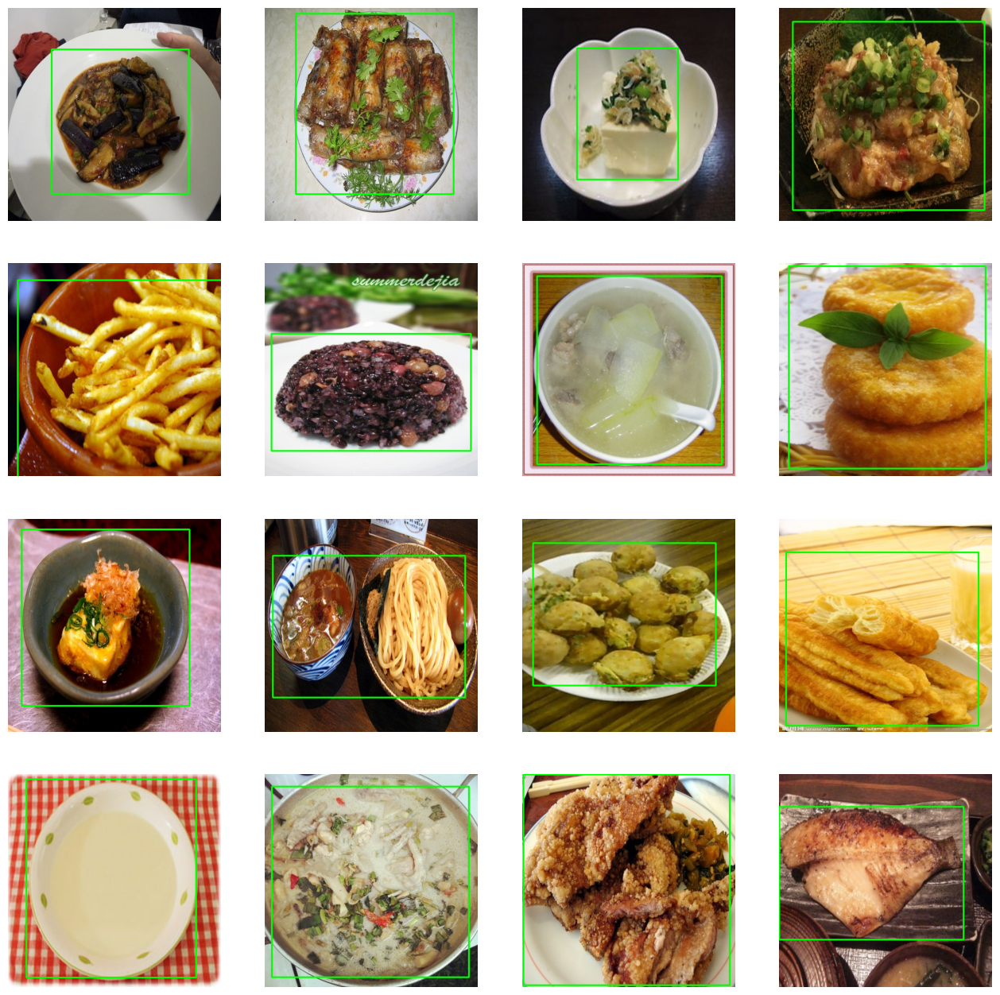

In [16]:
show_random_grid_generic(
    images_dir="/kaggle/working/new_data/train/images",
    labels_dir="/kaggle/working/new_data/train/labels",
    n=16, rows=4, cols=4
)

Creating `test` Folder

In [17]:
csv_to_yolo_dataset(
     csv_path="/kaggle/working/test_data.csv",
     output_root="/kaggle/working/new_data/test",
     target_size=(640, 640)
)

[skip row 34 img_id=200826] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 291 img_id=54083] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 341 img_id=45509] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 395 img_id=46005] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 413 img_id=308174] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 444 img_id=172251] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 452 img_id=49628] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 459 img_id=45967] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 530 img_id=57080] uneven lengths -> {'catego

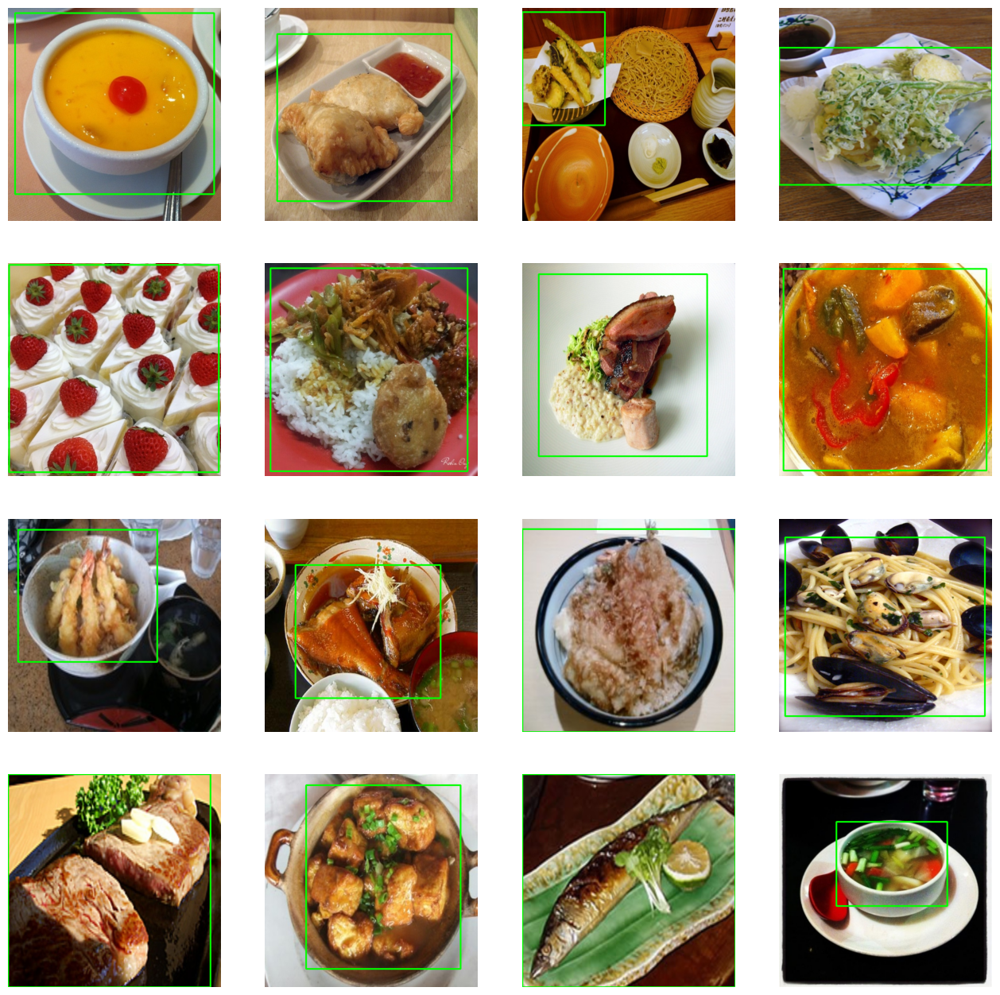

In [18]:
show_random_grid_generic(
    images_dir="/kaggle/working/new_data/test/images",
    labels_dir="/kaggle/working/new_data/test/labels",
    n=16, rows=4, cols=4
)

# Creating `val` Folder

In [19]:
csv_to_yolo_dataset(
     csv_path="/kaggle/working/val_data.csv",
     output_root="/kaggle/working/new_data/val",
     target_size=(640, 640)
)

[skip row 109 img_id=309375] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 115 img_id=308912] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 214 img_id=134656] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 217 img_id=44536] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 236 img_id=54085] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 278 img_id=45098] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 303 img_id=173259] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 507 img_id=179372] uneven lengths -> {'categories': 2, 'category_id': 1, 'x1': 1, 'y1': 1, 'x2': 1, 'y2': 1}
[skip row 511 img_id=265158] uneven lengths -> {'ca

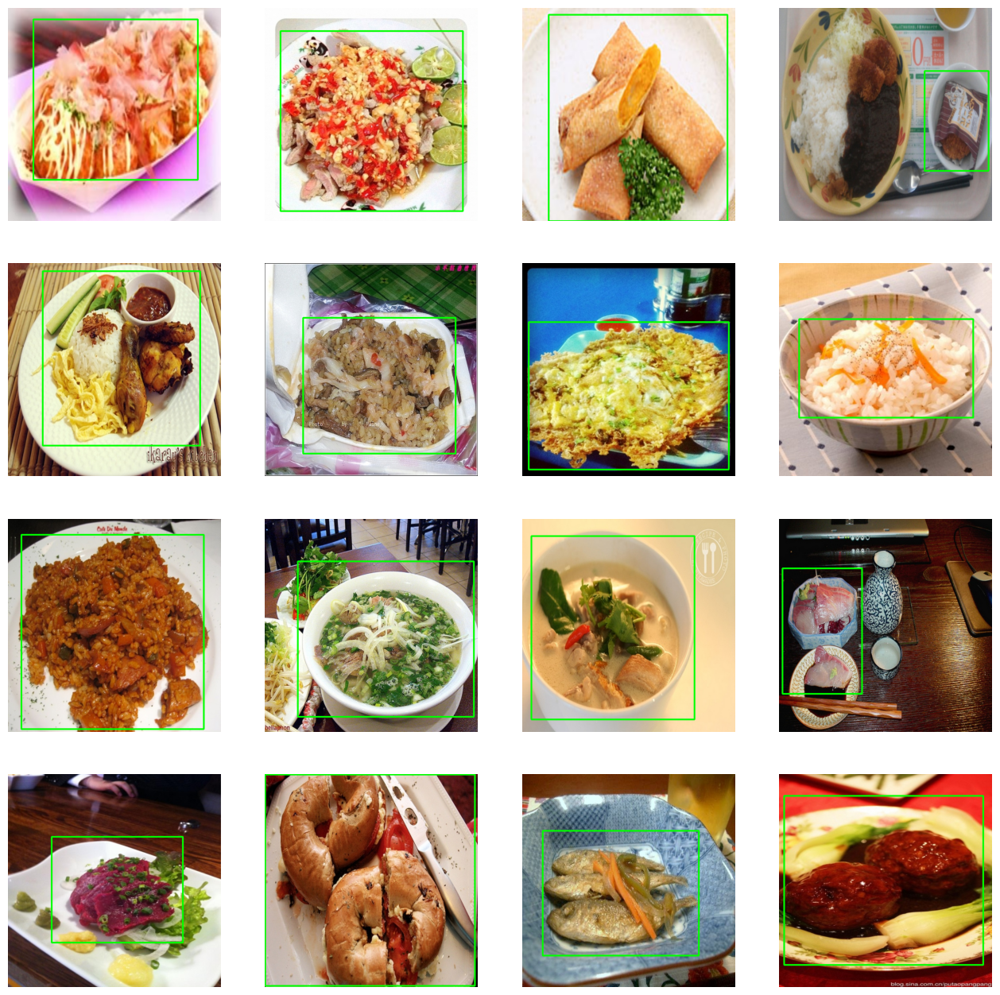

In [20]:
show_random_grid_generic(
    images_dir="/kaggle/working/new_data/val/images",
    labels_dir="/kaggle/working/new_data/val/labels",
    n=16, rows=4, cols=4
)

### Creating `data.yaml` File

In [21]:
from pathlib import Path
import yaml  # if missing: pip install pyyaml

cat_file = Path("/kaggle/input/uecfood256/UECFOOD256/category.txt")  # <- change if different

# read lines, skip header, split on TAB, keep "name" in id order
names_by_id = {}
for ln in cat_file.read_text(encoding="utf-8").splitlines():
    if not ln.strip() or ln.lower().startswith("id"):
        continue
    # split once on tab; some names contain spaces or hyphens
    parts = ln.split("\t", 1)
    if len(parts) != 2:
        # some editors may use multiple spaces instead of tabs:
        parts = ln.split(None, 1)  # split on any whitespace
        if len(parts) != 2:
            continue
    i, name = parts
    names_by_id[int(i)] = name.strip()

# YOLO expects class index 0..nc-1; sort by id and drop to a list
# Your ids are 1..256, so name at id=1 becomes index 0, etc.
names = [names_by_id[i] for i in sorted(names_by_id.keys())]

data = {
    "train": "/kaggle/working/new_data/train/images",
    "val":   "/kaggle/working/new_data/val/images",
    "test":  "/kaggle/working/new_data/test/images",
    "nc": len(names),
    "names": names,
}

out = Path("/kaggle/working/data.yaml")
with out.open("w", encoding="utf-8") as f:
    yaml.safe_dump(data, f, sort_keys=False, allow_unicode=True)

print(f"Wrote {out} with nc={len(names)}")

Wrote /kaggle/working/data.yaml with nc=256


### Fine-Tuning Yolov8n.pt

In [22]:
train_images = "/kaggle/working/new_data/train/images"
train_labels = "/kaggle/working/new_data/train/labels"

val_images = "/kaggle/working/new_data/val/images"
val_labels = "/kaggle/working/new_data/val/labels"

test_images = "/kaggle/working/new_data/test/images"
test_labels = "/kaggle/working/new_data/test/labels"

In [23]:
%pip install ultralytics
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 18.7 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 91.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 73.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.3 MB/s eta 0:00:00:00:0100:01
  Attempting unins

In [24]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [25]:
train_data = os.listdir(train_images)

train_image_file_paths = [os.path.join(train_images,i) for i in train_data if '.jpg' in i]
len(train_image_file_paths)

20069

In [26]:
val_data = os.listdir(val_images)

val_image_file_paths = [os.path.join(val_images,i) for i in val_data if '.jpg' in i]
len(val_image_file_paths)

5010

In [27]:
test_data = os.listdir(test_images)

test_image_file_paths = [os.path.join(test_images,i) for i in test_data if '.jpg' in i]
len(test_image_file_paths)

2790

In [28]:
model = YOLO("/kaggle/input/last-checkpoint/last.pt")  # path to your last.pt

model.train(
    data="/kaggle/working/data.yaml",
    epochs=25,              # 50 total - 41 already done
    imgsz=640,
    seed=42,
    patience=20,
    device="0,1",          # use "0" if you only have one GPU
    save=True,
    batch=30,
    save_period=10,
    project="runs",
    name="food256_yv8m_ddp_640",   # will create a new folder (e.g., ..._2) if one already exists
    workers=4
)

Ultralytics 8.3.202 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
                                                       CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=30, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data.yaml, degrees=0.0, deterministic=True, device=0,1, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/kaggle/input/last-checkpoint/last.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=food256_yv8m_ddp_640, nbs=64, nm

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       4937       5126      0.826      0.771      0.851      0.705
                  rice         14         14      0.195      0.286      0.293      0.257
          eels on rice         27         27      0.925          1      0.995      0.866
                 pilaf         17         17      0.756      0.548      0.745      0.535
chicken-'n'-egg on rice         17         17      0.798      0.647      0.732      0.672
   pork cutlet on rice         27         27      0.875      0.889      0.959      0.793
            beef curry         21         21      0.743       0.81      0.787      0.641
                 sushi         26         26      0.876      0.923      0.957      0.764
          chicken rice         15         15      0.884      0.733      0.782      0.564
            fried rice         25         25      0.597       0.72      0.797      0.687
          tempura bowl         20         20      0.788        0.9      0.963      0.811
              bibimb

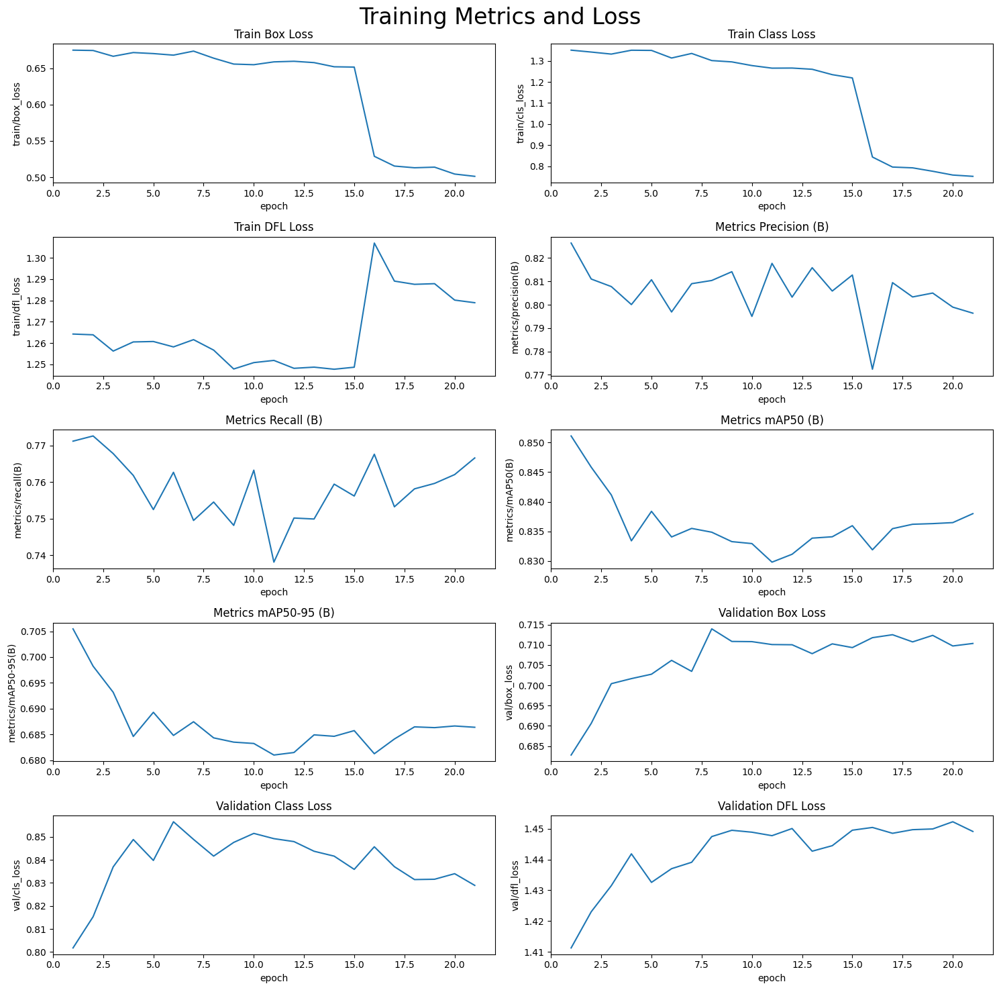

In [29]:
%matplotlib inline
df = pd.read_csv("/kaggle/working/runs/food256_yv8m_ddp_640/results.csv")
df.columns = df.columns.str.strip()


fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')
plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()

plt.show()

In [30]:
%matplotlib inline
model = YOLO("/kaggle/working/runs/food256_yv8m_ddp_640/weights/best.pt")
metrics = model.val(conf = 0.25, split = 'test')

Ultralytics 8.3.202 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 29,218,832 parameters, 0 gradients, 104.0 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 20.8±10.0 MB/s, size: 115.5 KB)
val: Scanning /kaggle/working/new_data/test/labels... 2790 images, 0 backgrounds, 52 corrupt: 100% ━━━━━━━━━━━━ 2790/2790 494.5it/s 5.6s0.0s
val: /kaggle/working/new_data/test/images/10598.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1278      1.0708]
val: /kaggle/working/new_data/test/images/10617.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.2306]
val: /kaggle/working/new_data/test/images/10711.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.3861]
val: /kaggle/working/new_data/test/images/10723.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1313]
val: /kaggle/working/new_data/test/

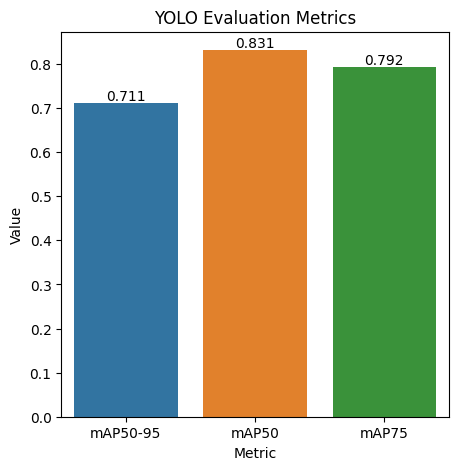

In [31]:
%matplotlib inline
ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[metrics.box.map, metrics.box.map50, metrics.box.map75])
ax.set_title('YOLO Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')
fig = plt.gcf()
fig.set_size_inches(5, 5)
for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')
plt.show()


0: 640x640 1 nasi campur, 44.7ms
Speed: 1.9ms preprocess, 44.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Caesar salad, 44.6ms
Speed: 1.7ms preprocess, 44.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 mixed rice, 44.6ms
Speed: 1.7ms preprocess, 44.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tempura, 40.3ms
Speed: 1.6ms preprocess, 40.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 grilled pacific saury, 26.5ms
Speed: 1.7ms preprocess, 26.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 chinese pumpkin pie, 26.1ms
Speed: 1.8ms preprocess, 26.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 bubur ayam, 26.0ms
Speed: 1.7ms preprocess, 26.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 boiled fish, 25.9ms
Speed: 1.6ms preprocess, 25.9ms infe

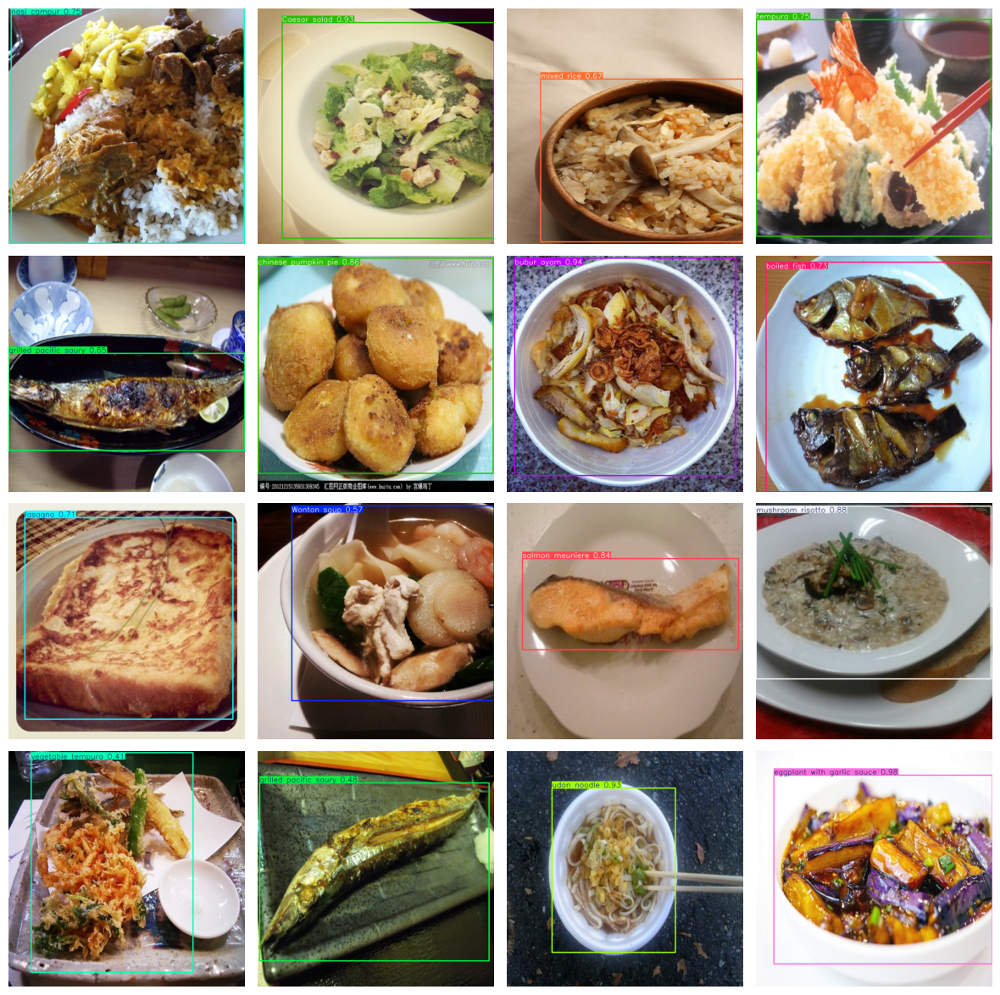

In [34]:
def img_detect(img_path):

    img = cv2.imread(img_path)
    detect_result = model(img)

    detect_img = detect_result[0].plot()
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)
    return detect_img


custom_image_dir = "/kaggle/working/new_data/test/images"

image_files = os.listdir(custom_image_dir)

selected_images = random.sample(image_files, 16)

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

for i, img_file in enumerate(selected_images):

    row_idx = i // 4
    col_idx = i % 4
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = img_detect(img_path)
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.05)